<H1> Experiments with Cacophony audio data and the Yamnet pre-trained neural network </H1>

[Yamnet](https://tfhub.dev/google/yamnet/1) is an audio event classifier trained on a the [AudioSet dataset](https://research.google.com/audioset/)
Based on the [MobileNetV1](https://arxiv.org/abs/1704.04861v1) depthwise-separable convolution architecture, it takes as input any length of audio signal (mono 16K sample rate) and breaks it up into 0.48s frames. For each frame it makes a probablistic prediction for each of the 521 classes in the AudioSet data.

Could this be useful with data recorded from the [Cacophony Project's](https://cacophony.org.nz/) Audio Monitoring? Currently there is the [Cacophony Index](https://www.2040.co.nz/blogs/news/you-can-now-see-your-cacophony-index) based on analysis of the changes in frequency bands within 20 second audio samples. This is an elegant solution and relatively simple to compute. However it does not have a very large dynamic range and is senstive to a number of noise sources in the environment which may result in misleading scores.

In theory a Neural Network like Yamnet could be used to score the number of bird (or likely bird) sounds which are encountered in an audio sample. It should be more robust to environmental noise as it has been designed to distinguish between a wide range of sounds. 


Quentin McDonald <br>
August 2021


In [1]:
import csv
import io
import os
import os.path
import glob
import datetime

import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_io as tfio

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import patches
from IPython import display
import pydub
from scipy import signal
import pandas as pd

# Common code moved to utils:
import utils
# Scoring moved to score:
import score

In [2]:
SAMPLE_RATE = 16000 # Work at 16000 sampling rate
TOP_K_SCORES = 3 # Score it a bird if a bird like sound is one of the top three scoring classifications

In [3]:
model,class_names = utils.load_model_and_class_names()

2021-09-17 11:14:51.099367: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2021-09-17 11:14:54.959291: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


<H3> Yamnet Class Names </H3>

Shown below are the 521 classes which Yamnet has been trained to recognize

BIRDS_CLASSES is a list of those classes associated with bird like sounds

In [4]:
for i in range(len(class_names)):
    print("{:3d} {}".format(i,class_names[i]))


  0 Speech
  1 Child speech, kid speaking
  2 Conversation
  3 Narration, monologue
  4 Babbling
  5 Speech synthesizer
  6 Shout
  7 Bellow
  8 Whoop
  9 Yell
 10 Children shouting
 11 Screaming
 12 Whispering
 13 Laughter
 14 Baby laughter
 15 Giggle
 16 Snicker
 17 Belly laugh
 18 Chuckle, chortle
 19 Crying, sobbing
 20 Baby cry, infant cry
 21 Whimper
 22 Wail, moan
 23 Sigh
 24 Singing
 25 Choir
 26 Yodeling
 27 Chant
 28 Mantra
 29 Child singing
 30 Synthetic singing
 31 Rapping
 32 Humming
 33 Groan
 34 Grunt
 35 Whistling
 36 Breathing
 37 Wheeze
 38 Snoring
 39 Gasp
 40 Pant
 41 Snort
 42 Cough
 43 Throat clearing
 44 Sneeze
 45 Sniff
 46 Run
 47 Shuffle
 48 Walk, footsteps
 49 Chewing, mastication
 50 Biting
 51 Gargling
 52 Stomach rumble
 53 Burping, eructation
 54 Hiccup
 55 Fart
 56 Hands
 57 Finger snapping
 58 Clapping
 59 Heart sounds, heartbeat
 60 Heart murmur
 61 Cheering
 62 Applause
 63 Chatter
 64 Crowd
 65 Hubbub, speech noise, speech babble
 66 Children playin

In [5]:
BIRDS_CLASSES = utils.BIRDS_CLASSES
print(BIRDS_CLASSES)

[ 93  93  95  96  97  98  99 100 101 102 106 107 108 109 110 111 113 114
 115]


In [6]:
def plot_wave_data(data, filename, bird_frames):
    """
    Given wave data in "data" from a file called "filename", plot the waveform.
    
    The list in bird_frames represents a set of boolean values which are True is the corresponding
    0.48s frame in the data file has bird sounds scoring highly. These will be shown as rectangles
    on the plot.
    """
    
    plt.style.use('seaborn')
    fig = plt.figure(2,figsize=(10,5),dpi=300)
    ax = fig.subplots(1)
    
    x = np.arange(len(data),dtype='float32')
    x = x/SAMPLE_RATE
    
    ax.plot(x,data,c='#6655DD')
    ax.set_title("Wave data from {}".format(filename))
    ax.set_xlabel("Time (s)")
    ax.set_ylabel("Amplitude")
    
    
    RECT_COL = '#DD5555EE'
    frame_width = (len(data)/len(bird_frames))/SAMPLE_RATE
    y_min,y_max = ax.get_ylim()
    for i,is_bird in enumerate(bird_frames):
        if is_bird:
            rect = patches.Rectangle((i*frame_width, y_min), frame_width,y_max-y_min, linewidth=1, edgecolor=RECT_COL, facecolor=RECT_COL)
            # Add the patch to the Axes
            ax.add_patch(rect)
    plt.show()

In [7]:
def plot_class_scores(classes, scores,filename):
    """
    Given a list of classes and the mean scores for each one plot a bar graph showing the data
    The "filename" is used for labelling purposes only. 
    
    """
    plt.style.use('seaborn')
    fig = plt.figure(2,figsize=(8,3),dpi=300)
    ax = fig.subplots(1)
    ax.barh(classes,scores, facecolor='#228855AA')
    ax.set_title("Most probable classes from {}".format(filename))
    ax.set_xlabel("Mean Score")
    ax.set_ylabel("Class")

    plt.show()

The main function which can be used to analyse an audio recording

In [8]:
def classify_audio_file(filename,model,class_names, N_top_scores=5,
                      low_pass_cutoff = None, 
                      high_pass_cutoff = None,
                      top_k_scores = TOP_K_SCORES):
    """
    Read audio data from the wave file given by "filename"
    Run the sound against the model and plot the probabilities of the five most likely
    classes
    Plot the wave data with the locations of bird classifications included
    If high_pass_cutoff and low_pass_cutoff are not None then lowpass and/or highpass filtering will 
    be performed
    """

    wave_data = utils.load_audio_16k_mono(filename, out_sample_rate=SAMPLE_RATE)   
    
    if low_pass_cutoff != None:
        wave_data =utils.butter_lowpass_filter( wave_data, low_pass_cutoff, SAMPLE_RATE, order=5)
    
    if high_pass_cutoff != None:
        wave_data =utils.butter_highpass_filter( wave_data, high_pass_cutoff, SAMPLE_RATE, order=5)
        
   
    # Evaluate the data against the model:
    scores, embeddings, spectrogram = model(wave_data)
    
    class_scores = tf.reduce_mean(scores, axis=0)
    frame_classes = tf.argmax(scores, axis=1)
    
    
    top_scores = tf.math.top_k(
        scores, k=top_k_scores, sorted=True, name=None)
  
    top_scores = top_scores[1].numpy()
    
    # Construct a list of frames which had bird sounds in the top_k_scores
    bird_frames = []
    for i in range(top_scores.shape[0]):
        for frame_class in top_scores[i,:]:
            if frame_class in BIRDS_CLASSES:
                bird_frames.append(1)
            else:
                bird_frames.append(0)
        
    
    top_class_scores = tf.math.top_k(
        class_scores, k=5, sorted=True, name=None)
    classes = []
    scores = []
    for i,k in enumerate(top_class_scores[1].numpy()):
        classes.append(class_names[k])
        scores.append(top_class_scores[0][i].numpy())
      
    plot_class_scores(classes,scores,filename)
    plot_wave_data(wave_data,filename, bird_frames)
   
    #plot_embeddings(embeddings,filename)
    return wave_data

<H3> Analysis of three audio files </H3>

Three audio files are analysed in the next section:

dawn.mp3  - From around 7am where the birds are expected to be at their loudest and most active

day.mp3   - From around 2pm

night.mp3 - Around about 11pm, should have very little bird sound

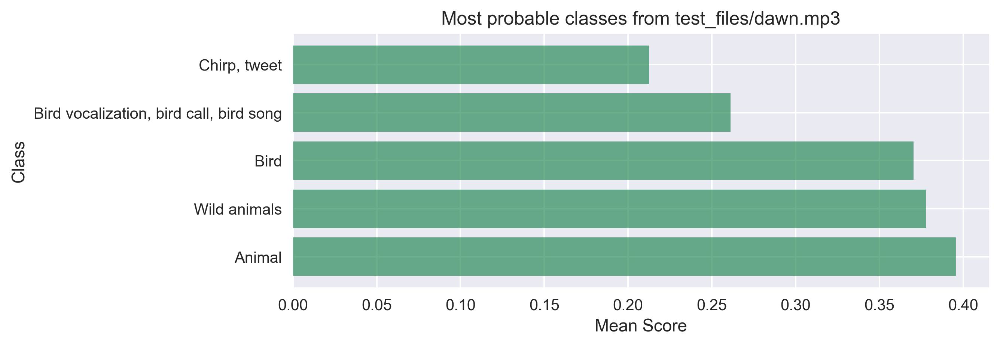

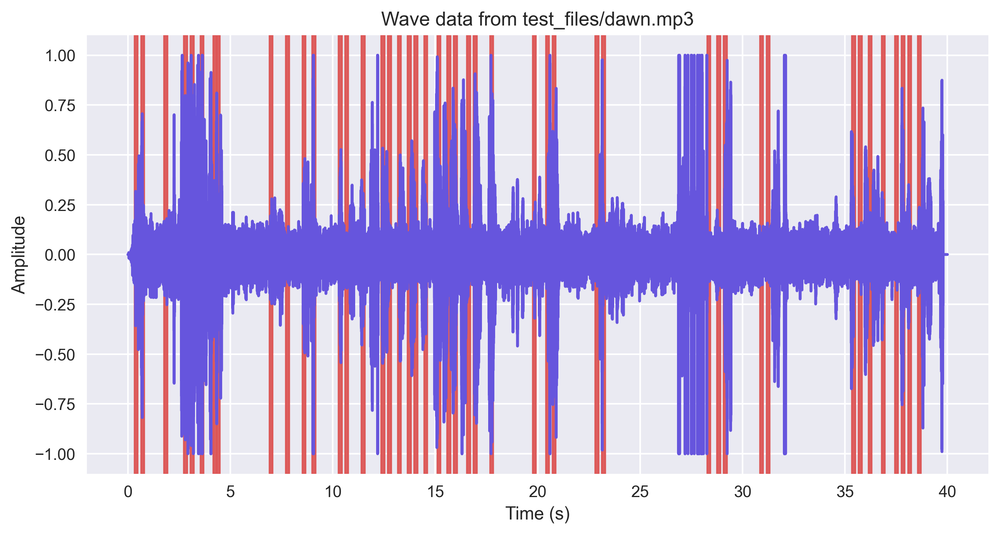

In [23]:
wave_data = classify_audio_file('test_files/dawn.mp3',model,class_names)
display.Audio(wave_data,rate=16000)

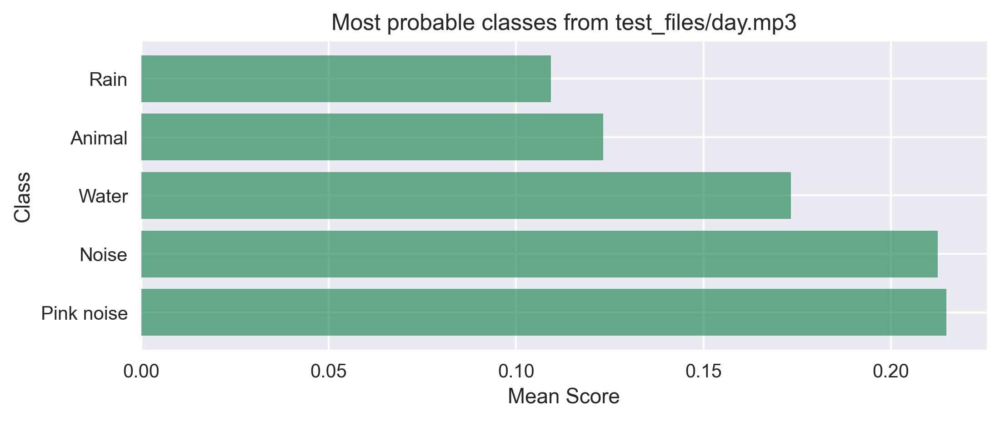

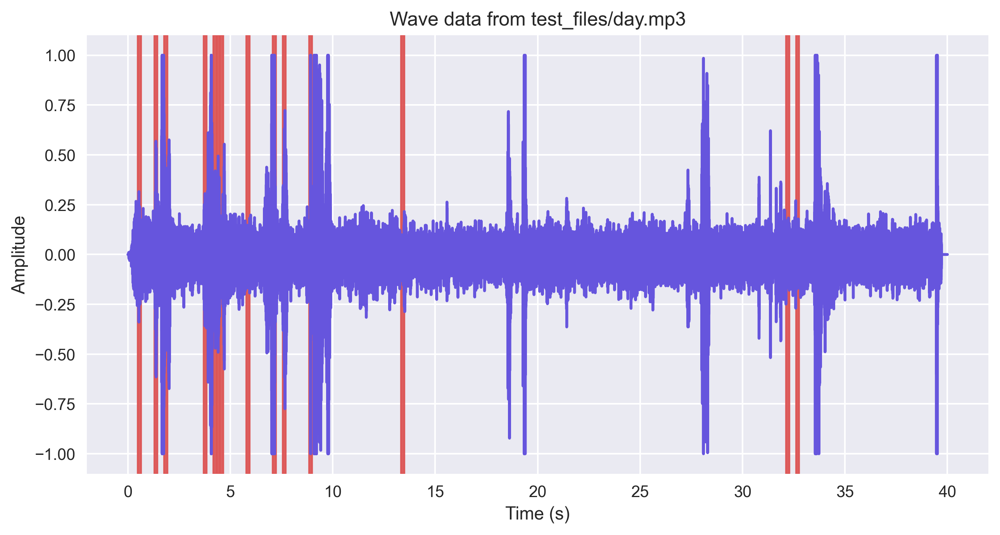

In [24]:
wave_data = classify_audio_file('test_files/day.mp3',model,class_names)
display.Audio(wave_data,rate=16000)

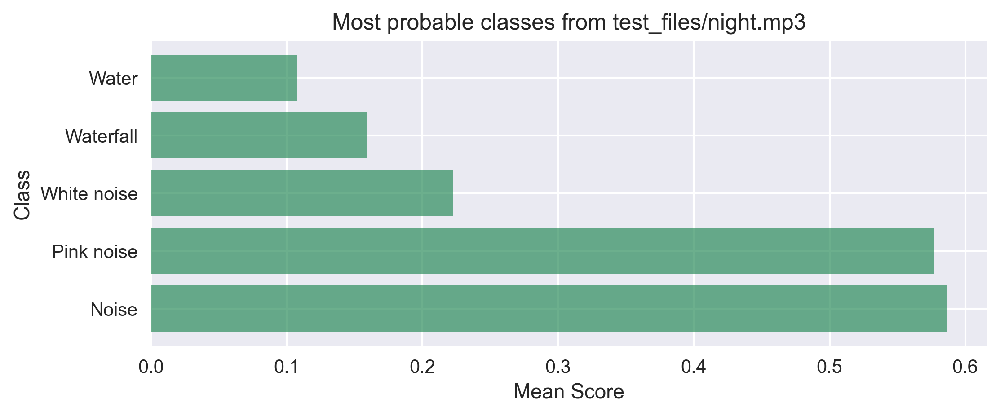

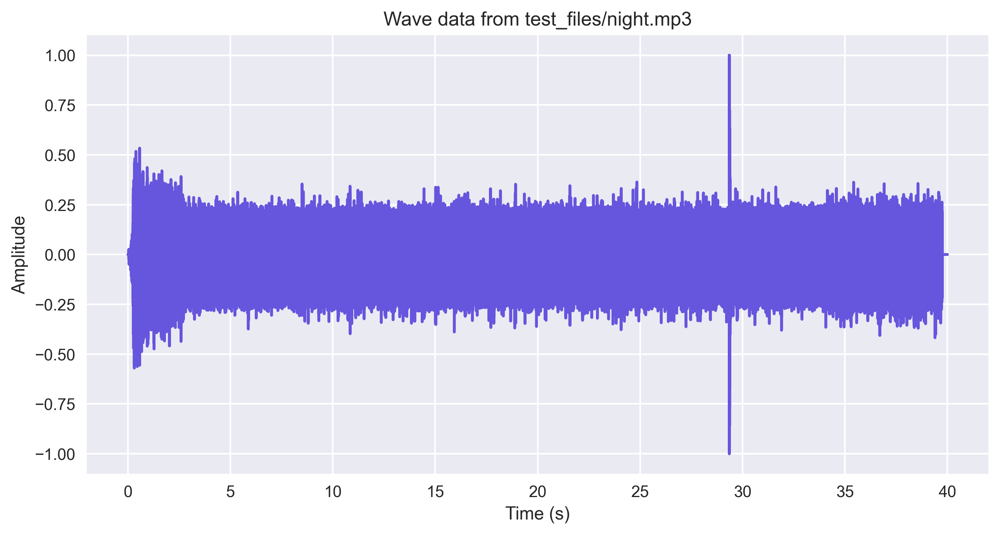

In [25]:
wave_data = classify_audio_file('test_files/night.mp3',model,class_names)
display.Audio(wave_data,rate=16000)

<H3> Classification after band_pass_filtering </H3>
    
One relatively simple way to improve the classification may be to remove any noise outside that of the normal bird song frequency. Birds mostly sing in the range 2000-4000 Hz so filters are used to greatly attenuate any sounds outside that range and then the analysis can be performed again   
    

In [12]:
LOW_PASS_CUTOFF = 4000
HIGH_PASS_CUTOFF = 2000

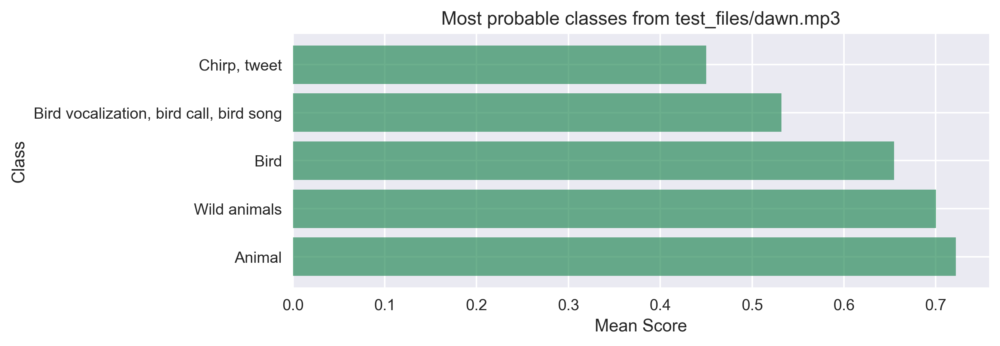

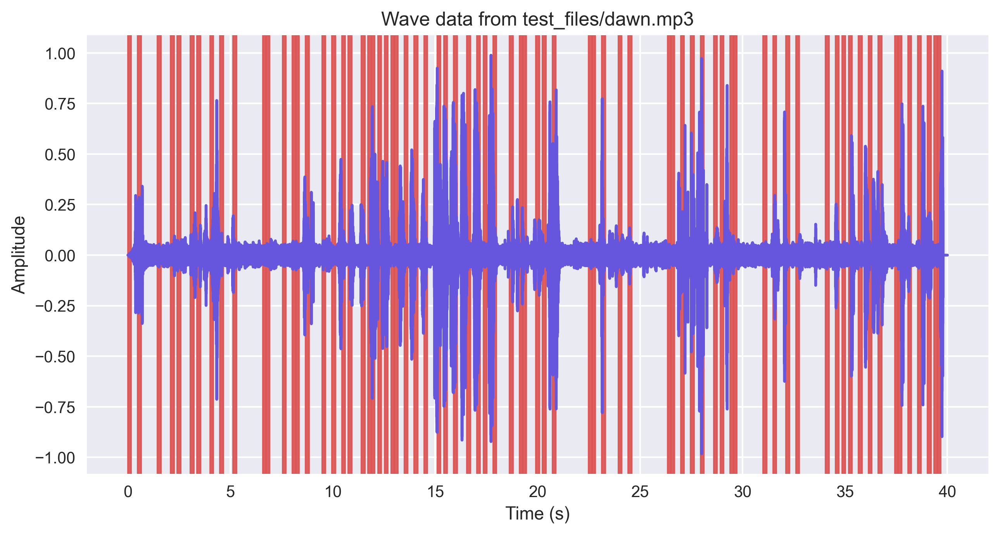

In [26]:
wave_data = classify_audio_file('test_files/dawn.mp3',model,class_names,low_pass_cutoff=LOW_PASS_CUTOFF,high_pass_cutoff=HIGH_PASS_CUTOFF)
display.Audio(wave_data,rate=SAMPLE_RATE)

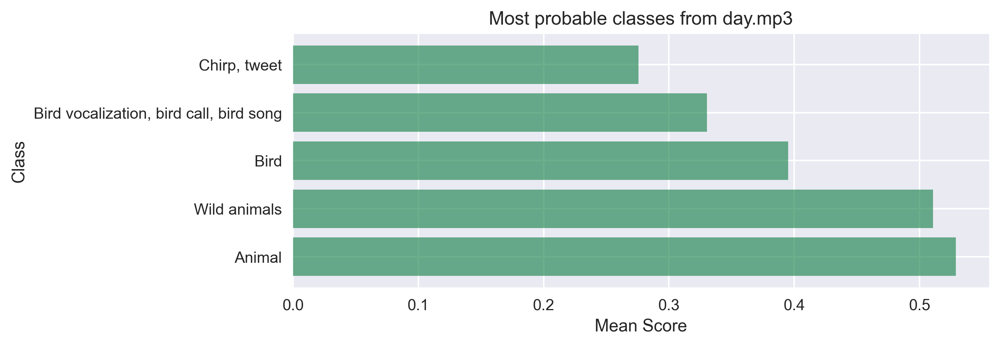

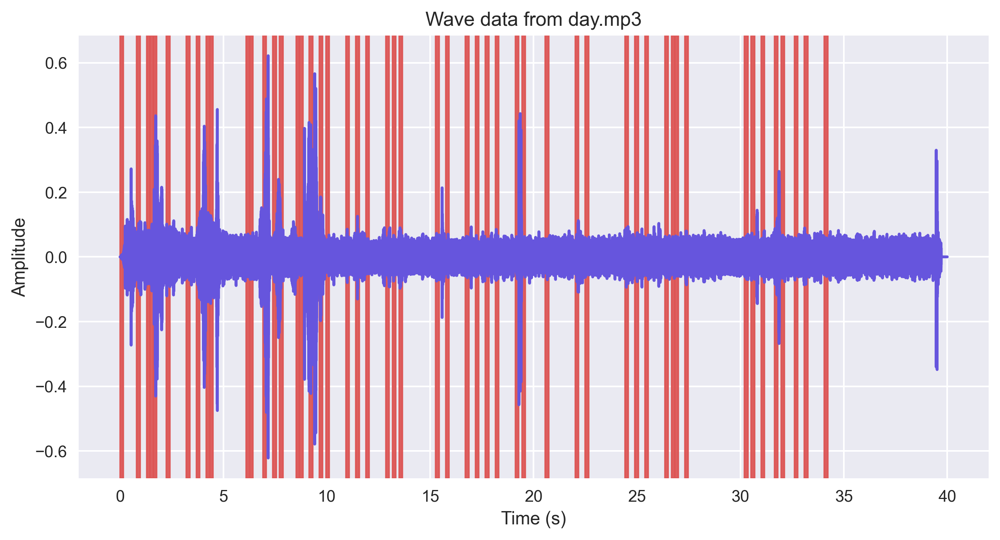

In [14]:
wave_data = classify_audio_file('day.mp3',model,class_names,low_pass_cutoff=LOW_PASS_CUTOFF,high_pass_cutoff=HIGH_PASS_CUTOFF)
display.Audio(wave_data,rate=SAMPLE_RATE)

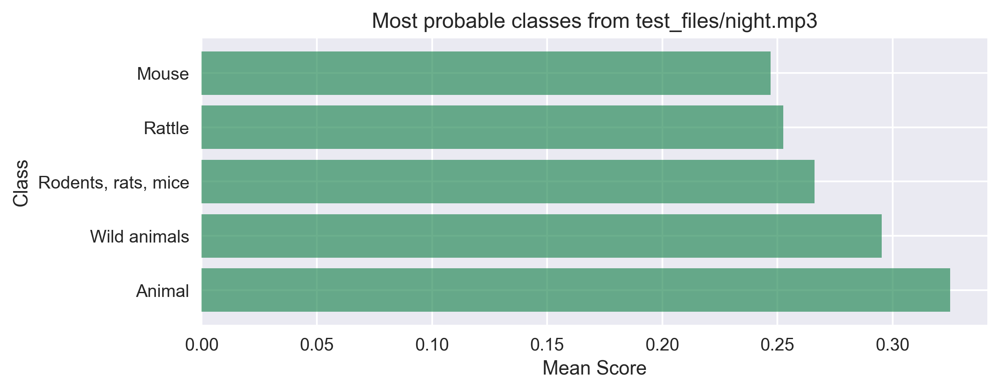

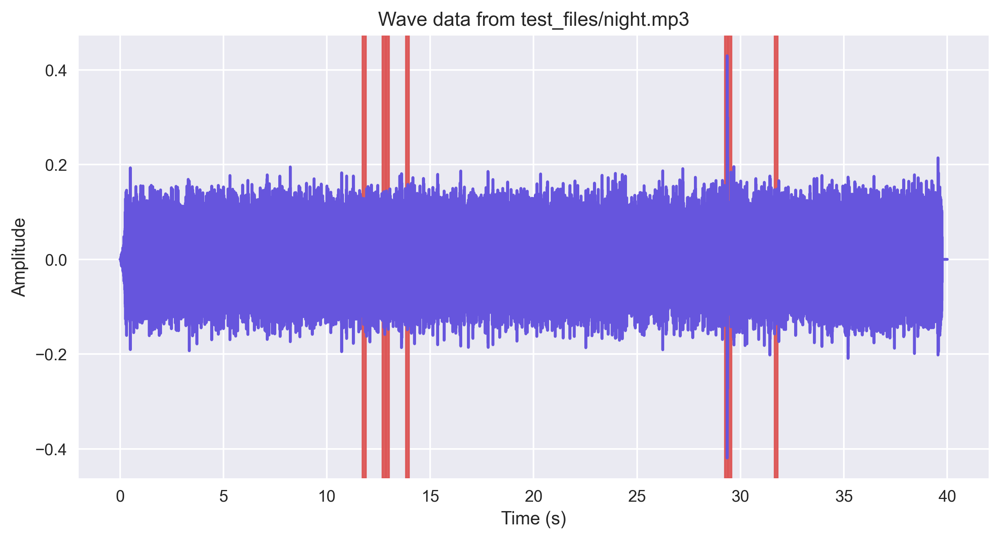

In [27]:
wave_data = classify_audio_file('test_files/night.mp3',model,class_names,low_pass_cutoff=LOW_PASS_CUTOFF,high_pass_cutoff=HIGH_PASS_CUTOFF)
display.Audio(wave_data,rate=SAMPLE_RATE)

<H2> A scoring system based on Yamnet </H2>

Since it appears that Yamnet classifications are fairly good at recognizing birds it is worth looking to see if we can come up with a scoring system which applys the model repeatedly with slightly offet frames and returns the
average number of bird like sounds classified.

Since bandpass filtering in the range 2000-4000 Hz appeared to give better classifications that will be done here as well.

In [16]:
def score_audio_file(filename,model, num_offsets = 5,
                      low_pass_cutoff = None, 
                      high_pass_cutoff = None,
                      top_k_scores = TOP_K_SCORES,
                      verbose=False):
    """
    Read audio data from the wave or mp3 file given by "filename"
    If high_pass_cutoff and low_pass_cutoff are not None then lowpass and/or highpass filtering will 
    be performed
    Run the sound data against the model and count the number of bird like sounds. Run the model num_offsets
    time, offsetting the start of the file by 1/num_offsets of a frame each time
    Return the average bird count
    """

    wave_data = utils.load_audio_16k_mono(filename, out_sample_rate=SAMPLE_RATE)   
    
    if low_pass_cutoff != None:
        wave_data =utils.butter_lowpass_filter( wave_data, low_pass_cutoff, SAMPLE_RATE, order=5)
    
    if high_pass_cutoff != None:
        wave_data =utils.butter_highpass_filter( wave_data, high_pass_cutoff, SAMPLE_RATE, order=5)
        
   
    # Evaluate the data against the model:
    scores, embeddings, spectrogram = model(wave_data)
    
    num_frames = len(scores)
    sum_counts = 0
    offset = int((len(wave_data)/num_frames)/num_offsets)
    
    
    for i in range(num_offsets):
        
        scores, embeddings, spectrogram = model(wave_data[i*offset:])
        top_scores = tf.math.top_k(
        scores, k=top_k_scores, sorted=True, name=None)
  
        top_scores = top_scores[1].numpy()
    
        # Count the number of birds in each frame
        count = 0
        bird_frames = []
        for k in range(top_scores.shape[0]):
            for frame_class in top_scores[k,:]:
                if frame_class in BIRDS_CLASSES:
                    count += 1
                    break
        sum_counts += count
        
        if verbose:
            print("{:2d} Offset = {:5.3f}, Offset count = {:3d}".format(i,(i*offset)/SAMPLE_RATE,count))
        
    
    # Score is averaged over all the offset applications of the model and then divided by the number of frames
    # to give a value in the range 0-1
    
    return (sum_counts/float(num_offsets))/float(num_frames)

In [28]:
files = ["dawn.mp3","day.mp3","night.mp3"]

scores = []

for f in files:  
    fn = os.path.join("test_files", f)
    score = score_audio_file(fn,model,num_offsets=3,
                low_pass_cutoff=LOW_PASS_CUTOFF,high_pass_cutoff=HIGH_PASS_CUTOFF, 
                verbose=False)
    scores.append(score)
    

data_dict = {
    "Filename": files,
    "Score": scores 
}
pd.DataFrame.from_dict(data_dict)

,Filename,Score
0,dawn.mp3,0.827309
1,day.mp3,0.554217
2,night.mp3,0.076305


Intuitvely these scores make a certain amount of sense, birds singing mostly during the dawn, less during the day and not at all during the night.

<H3> Scoring one day's worth of recordings </H3>

For a more robust comparison we can now go ahead and compute the scores for the 30+ recordings from a single day. 
These can be compared with the Cacophony Index values computed for each recording

In [18]:
def score_files_in_directory(directory):

    """
    Create a Yamnet score for each file in the given directory
    Plot those against the time of the recording 
    If there's a "recordings.csv" in the directory then read that and use that to read cacophony scores
    Usually the recordings (in wav format) will represent an entire day's worth of recording
    
    """
    files = glob.glob("{}/*.mp3".format(directory))
    scores = []
    dates = []
    
    cacophony_indices = utils.read_cacophony_indices(directory)
    
    for f in sorted(files):
        score = score_audio_file(f,model,num_offsets=5,
                low_pass_cutoff=LOW_PASS_CUTOFF,high_pass_cutoff=HIGH_PASS_CUTOFF, 
                  verbose=False)
        dates.append(utils.filename_to_date(f))
        scores.append(score)
       
    fig = plt.figure(2,figsize=(15,10),dpi=300)
    ax = fig.subplots(1)
    ax.set_title("Yamnet derived scores for data recorded {}".format(directory))
    ax.set_xlabel("Time")
    ax.set_ylabel("Score")
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    lns1=ax.plot(dates,scores,c='#AA55AA',linewidth=3,label='Yamnet Index')
    
    
    if len(cacophony_indices) == len(scores):
        ax2 = ax.twinx()  # instantiate a second axes that shares the same x-axis
        lns2 = ax2.plot(dates,cacophony_indices,c='#AAAA55',linestyle='dotted',label='Cacophony Index')
        ax2.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
        ax2.set_ylabel("Cacophony Index")
        
        lns = lns1+lns2
        labs = [l.get_label() for l in lns]
        ax.legend(lns, labs, loc=0)
    plt.show()

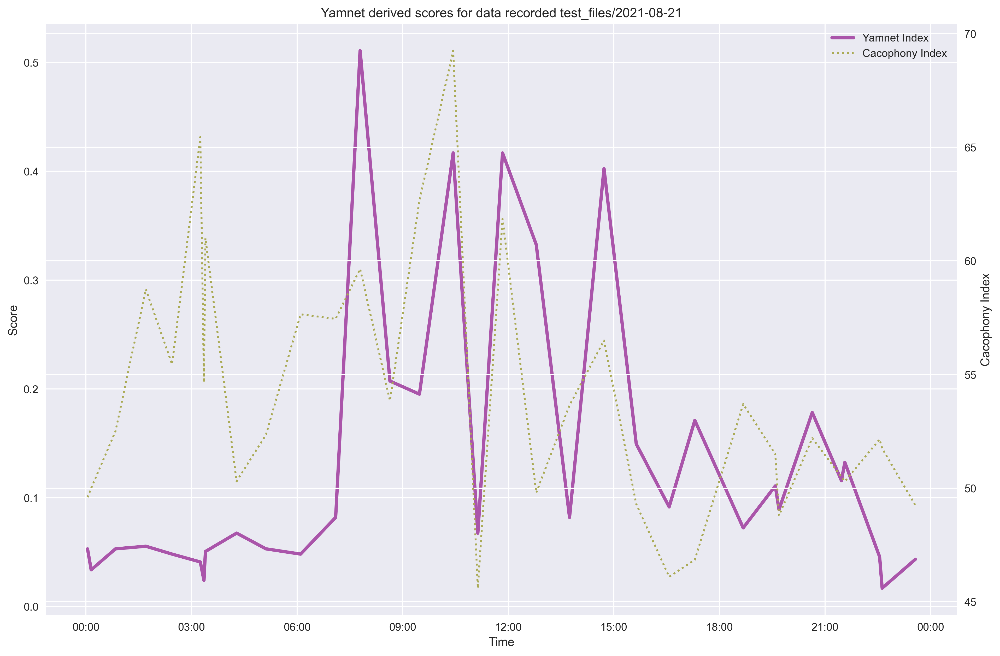

In [29]:
score_files_in_directory("test_files/2021-08-21")

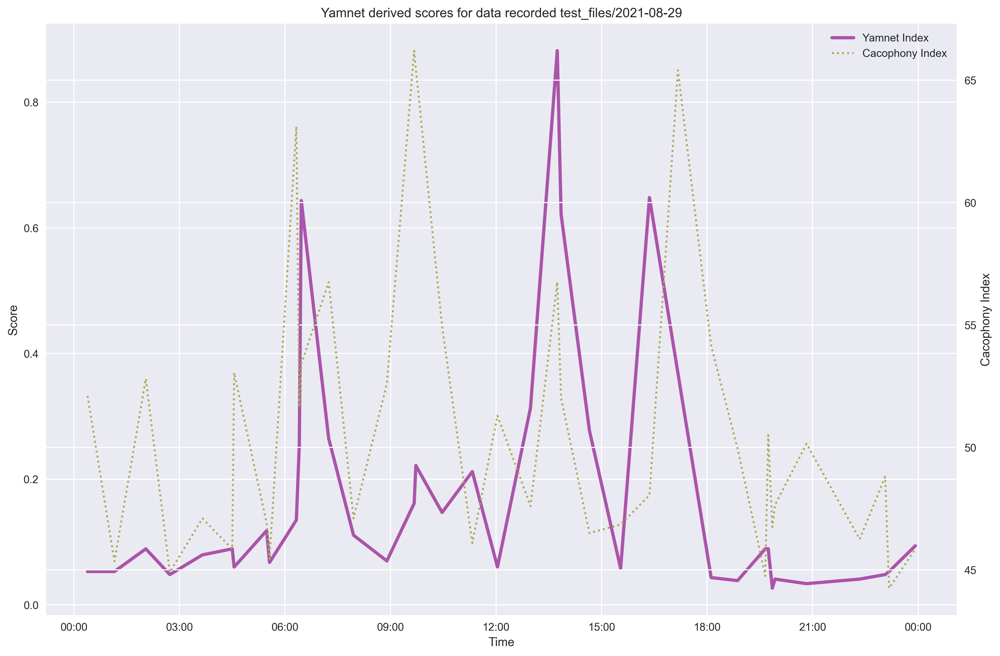

In [30]:
score_files_in_directory("test_files/2021-08-29")

Although there's some variation in the results during the day they seem to fit the expected trends with high values during the dawn and relatively low values at night.



<H3> What a maximum score might look like </H3>

What follows is a recording from the [DOC website](https://www.doc.govt.nz/nature/native-animals/birds/bird-songs-and-calls/) of a dawn chourus with Bellbird prominent. 

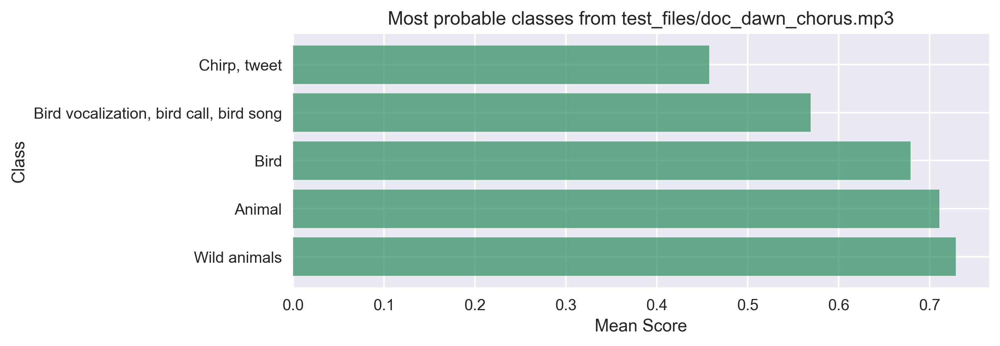

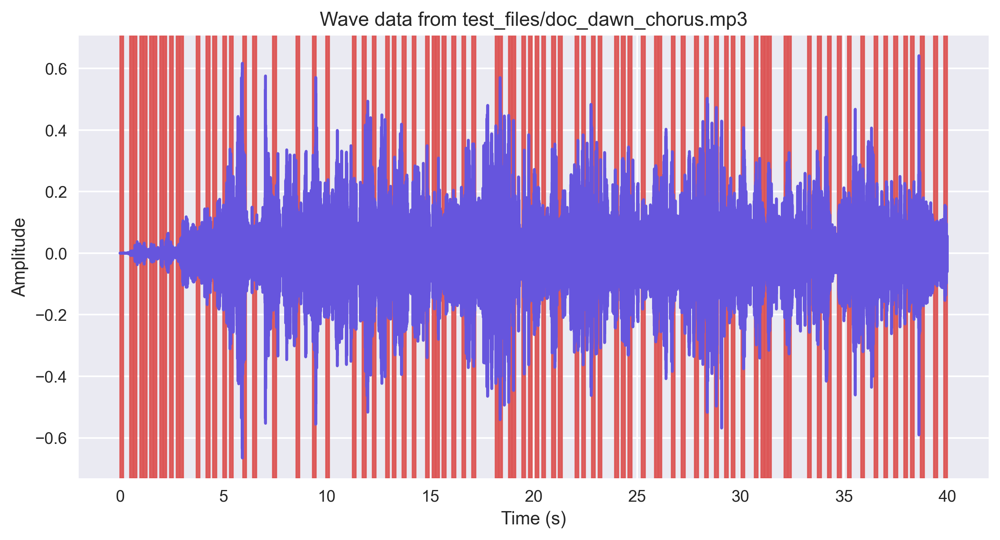

In [31]:
wave_data = classify_audio_file('test_files/doc_dawn_chorus.mp3',model,class_names,low_pass_cutoff=LOW_PASS_CUTOFF,high_pass_cutoff=HIGH_PASS_CUTOFF)
display.Audio(wave_data,rate=SAMPLE_RATE)

In [22]:
print("Score for DOC dawn chorus = {:.2f}".format(score_audio_file("doc_dawn_chorus.mp3",model,num_offsets=5,
                low_pass_cutoff=LOW_PASS_CUTOFF,high_pass_cutoff=HIGH_PASS_CUTOFF, 
                verbose=False)))

Score for DOC dawn chorus = 0.92


<H2> Conclusions, caveats and next steps </H2>

So far the use of a neural network based audio classification looks promising. It most be remebered however that his is based on data from a single device in a single location and the findings here may not turn out to be as generally useful on a larger dataset. Applying this methodolgy to more data and from a varietry of sources would give us more confidence in the robustness to noise and generality of this approach.

There are a number of interesting possibilities for this technology yet to be explored. Yamnet returns, along with the classification score, a 1024 element vector for each audio frame (so 83 such vectors for the typical 40 second recordings used in this study). This is a relatively rich feature embedding which could be used as inputs to subsequent neural networks in order to
<ul>
    <li> Retrain based on recognizing birds in our environments. This would allow a more robust recognition of NZ bird calls.  This may have some challenges in that each frame needs to be labeled, but if recordings can be found with substantially bird calls in them it would be easier. Currently a number of frames with bird like sounds appear to be returned as a general "animal" type classification and perhaps further training on our own data could improve this.
    <li> Train a network to recognize birds by species. Especially loud and distinctive birds like the Korimako (Bellbird), Tūī or Riroriro (Gray Warbler). Having counts of specific native species would be useful information.
    <li> Perform clustering/similarity analysis between locations based on euclidian or other distance metric between the embeddings.
</ul>


In addition to this there are some future parameter optimizations and relatively minor enhancements that could be explored:
<ul>
    <li> Optimize the number of offset versions of the recording used to calculate the score
    <li> Rather than simply look at the three highest scoring classifications, examine the scores for bird like classiciations and 'count' a bird if the score is above a certain threshold (see Part 2 link below)
    <li> Optimize the number of top scoring classifications to be considered when looking to score a frame as a bird sound

</ul>

See [Part 2](Yamnet_Audio_Classification_Experiments_Part_2.ipynb) for some more progress on alternative methods for scoring
See [Part 3](Yamnet_Audio_Classification_Experiments_Part_3.ipynb) for work with larger datasets